<a href="https://colab.research.google.com/github/MehakArora/ImageInpainting/blob/main/finalRPCA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
!pip3 install --upgrade opencv-contrib-python
!pip install tensorflow-gpu==2.0

In [7]:
import tensorflow as tf
print(tf.__version__)
from tensorflow import keras
from tensorflow.python.client import device_lib

#print('[INFO]', tf.config.experimental.list_physical_devices('GPU')[0])

2.0.0


In [8]:
import os
import cv2
print(cv2.__version__)
import numpy as np

import matplotlib.pyplot as plt
#matplotlib inline
from skimage.metrics import structural_similarity as SSIM

from mpl_toolkits.axes_grid1 import ImageGrid

4.5.5


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from zipfile import ZipFile
  
# specifying the zip file name
file_name = "GM.zip"
# opening the zip file in READ mode
with ZipFile(file_name, 'r') as zip:
    # printing all the contents of the zip file
    zip.printdir()
  
    # extracting all the files
    print('Extracting all the files now...')
    zip.extractall()
    print('Done!')

In [12]:
"Getting File Names"

test_path = './seg_test/seg_test/'
test_folders = os.listdir(test_path)
test_files = []

for folder in test_folders:
    files_f = os.listdir(test_path + folder + '/')
    for file in files_f:
        test_files.append(test_path + folder + '/' + file)


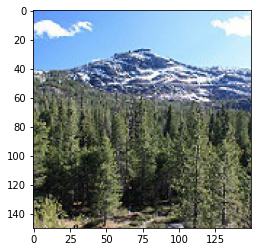

In [14]:
from matplotlib import test
from matplotlib.image import imread
test_files
img = imread(test_files[1])
plt.imshow(img)

In [15]:
def __init__(self, X, y, batch_size=32, dim=(64, 64), n_channels=3, shuffle=True):
      'Initialization'
      self.batch_size = batch_size 
      self.X = X 
      self.y = y
      self.dim = dim
      self.n_channels = n_channels
      self.shuffle = shuffle
      
      self.on_epoch_end()

def __len__(self):
      'Denotes the number of batches per epoch'
      return int(np.floor(len(self.X) / self.batch_size))

def __getitem__(self, index):
      'Generate one batch of data'
      # Generate indexes of the batch
      indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

      # Generate data
      return self.__data_generation(indexes)

def on_epoch_end(self):
      'Updates indexes after each epoch'
      self.indexes = np.arange(len(self.X))
      if self.shuffle:
          np.random.shuffle(self.indexes)
def __data_generation(self, idxs):
    # X_batch is a matrix of masked images used as input
    X_batch = np.empty((self.batch_size, self.dim[0], self.dim[1], self.n_channels)) # Masked image
    # y_batch is a matrix of original images used for computing error from reconstructed image
    y_batch = np.empty((self.batch_size, self.dim[0], self.dim[1], self.n_channels)) # Original image

    ## Iterate through random indexes
    for i, idx in enumerate(idxs):
      image_copy = self.X[idx].copy()
  
      ## Get mask associated to that image
      masked_image = self.__createMask(image_copy)
      
      X_batch[i,] = masked_image/255
      y_batch[i] = self.y[idx]/255
      
    return X_batch, y_batch


def createMask( img):
    ## Prepare masking matrix
    mask = np.full(img.shape, 255, np.uint8)
    for _ in range(np.random.randint(1, 10)):
      # Get random x locations to start line
      x1, x2 = np.random.randint(1, img.shape[0]), np.random.randint(1, img.shape[1])
      # Get random y locations to start line
      y1, y2 = np.random.randint(1, img.shape[0]), np.random.randint(1, img.shape[1])
      # Get random thickness of the line drawn
      thickness = np.random.randint(1, 3)
      # Draw black line on the white mask
      cv2.line(mask,(x1,y1),(x2,y2),(1,1,1),thickness)

    # Perforn bitwise and operation to mak the image
    masked_image = cv2.bitwise_and(img, mask)

    return masked_image



In [ ]:
rows = 30
sample_idx = 54
fig, axs = plt.subplots(nrows=rows, ncols=3, figsize=(6, 2*rows))

for i in range(0):

  #img = imread(test_files[i])
  img  = imread("image1.jpg")
  mask = createMask(img)
  L_image = mask*0
  S_image = mask*0
  rank = []

  for j in range(3):
      L_image[:,:,i] ,S_image[:,:,i], rnk = RobustPCA(mask[:,:,i], tol = 0.5, max_iter=100000)
      rank.append(rnk)
  
  #PSNR_val = cv2.PSNR(img_orig_gray, img_inpainted_gray, 255)
  #print(PSNR)
  #SSIM_val = SSIM(sample_labels[i], impainted_image.reshape(impainted_image.shape[1:]),multichannel=True)
  #SSIM_val = SSIM(img_orig_gray, img_inpainted_gray,multichannel=True)
  
  #print("Image (%i): PSNR = %f, SSIM = %f"%(i+1,PSNR_val,SSIM_val))

  
  axs[i][0].imshow(img)
  axs[i][1].imshow(mask)
  axs[i][2].imshow(L_image)

plt.show()

Robust PCA ...
for image 1
Converged!
Converged!
Converged!
Robust PCA ...
for image 2
Converged!
Converged!
Converged!
Robust PCA ...
for image 3
Converged!
Converged!
Converged!
Robust PCA ...
for image 4
Converged!
Converged!
Converged!
Robust PCA ...
for image 5
Converged!
Converged!
Converged!
Robust PCA ...
for image 6
Converged!
Converged!
Converged!
Robust PCA ...
for image 7
Converged!
Converged!
Converged!
Robust PCA ...
for image 8
Converged!
Converged!
Converged!
Robust PCA ...
for image 9
Converged!
Converged!
Converged!
Robust PCA ...
for image 10
Converged!
Converged!
Converged!
Robust PCA ...
for image 11
Converged!
Converged!
Converged!
Robust PCA ...
for image 12
Converged!
Converged!
Converged!
Robust PCA ...
for image 13
Converged!
Converged!
Converged!
Robust PCA ...
for image 14
Converged!
Converged!
Converged!
Robust PCA ...
for image 15
Converged!
Converged!
Converged!
Robust PCA ...
for image 16
Converged!
Converged!
Converged!
Robust PCA ...
for image 17
Conve

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Robust PCA ...
for image 22
Converged!
Converged!
Converged!
Robust PCA ...
for image 23
Converged!
Converged!
Converged!
Robust PCA ...
for image 24
Converged!
Converged!
Converged!
Robust PCA ...
for image 25
Converged!
Converged!
Converged!
Robust PCA ...
for image 26
Converged!
Converged!
Converged!
Robust PCA ...
for image 27
Converged!
Converged!
Converged!
Robust PCA ...
for image 28
Converged!
Converged!
Converged!
Robust PCA ...
for image 29
Converged!
Converged!
Converged!
Robust PCA ...
for image 30
Converged!
Converged!
Converged!


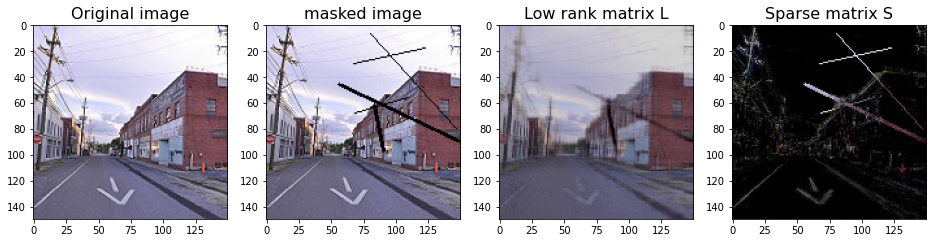

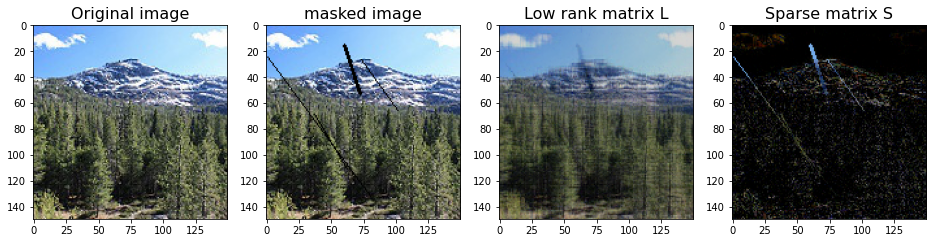

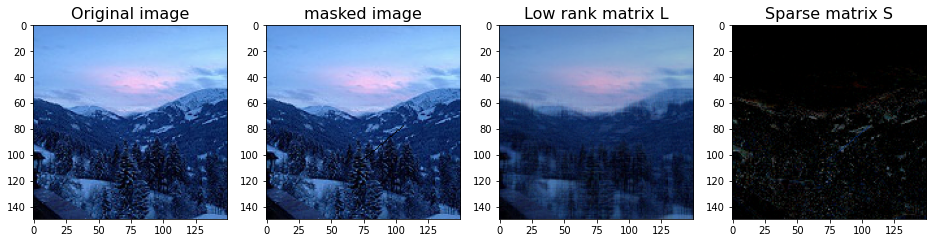

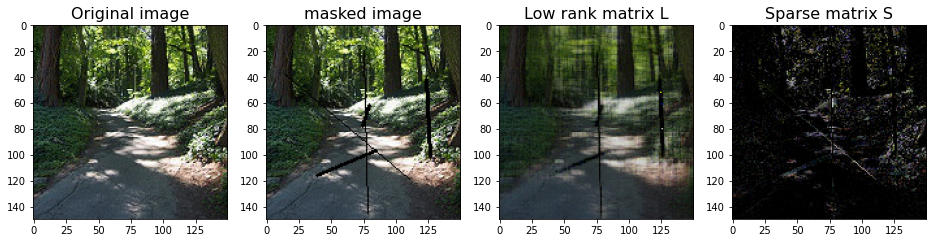

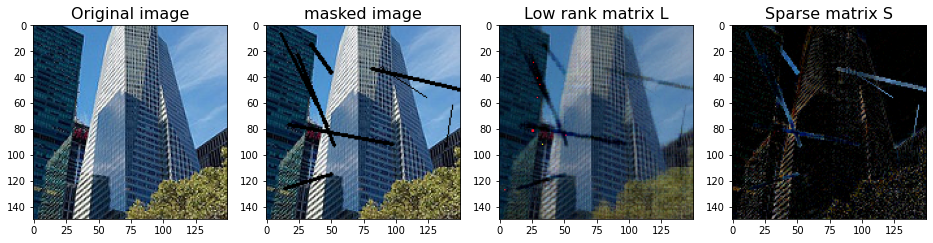

...

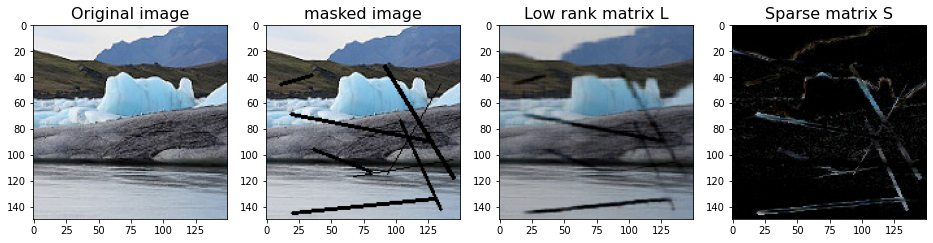

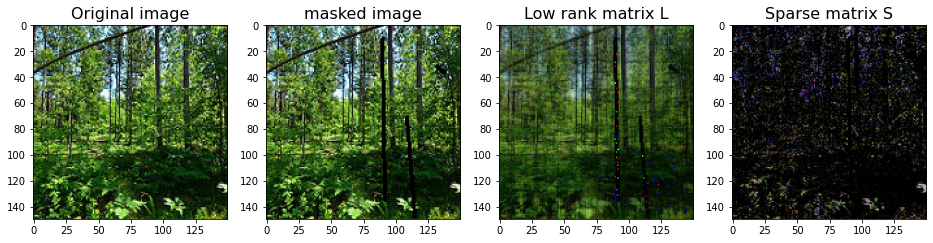

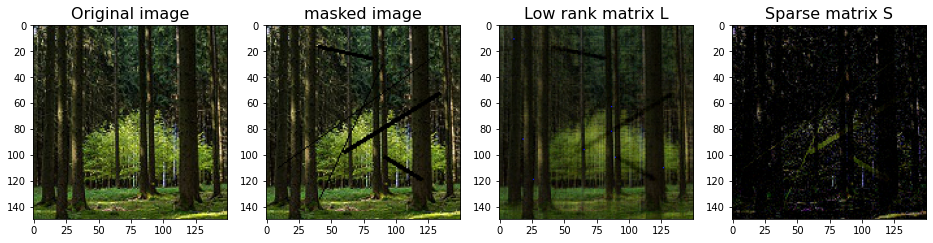

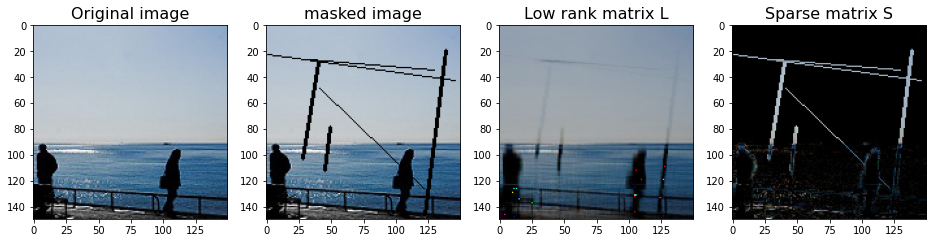

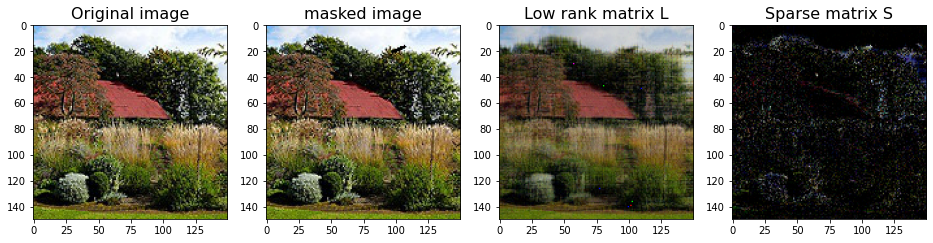

In [85]:
import tensorflow as tf
def dice_coef(y_true, y_pred):
   y_true_f = keras.backend.flatten(y_true)
   y_pred_f = keras.backend.flatten(y_pred)
   intersection = keras.backend.sum(y_true_f * y_pred_f)
   return (2. * intersection) / (keras.backend.sum(y_true_f + y_pred_f))

def get_psnr(y_true, y_pred):
  val = tf.image.psnr(y_true, y_pred, 255)
  return val
  

def get_ssim(y_true, y_pred):
  y_true_tensor = tf.image.convert_image_dtype(y_true, tf.float64)
  y_pred_tensor = tf.image.convert_image_dtype(y_pred, tf.float64)
  val = tf.image.ssim(y_true_tensor, y_pred_tensor, 255)
  return float(val)


def createMask( img):
    ## Prepare masking matrix
    
    mask = np.full(img.shape, 255, np.uint8)
    for _ in range(np.random.randint(1, 10)):
      # Get random x locations to start line
      x1, x2 = np.random.randint(1, img.shape[0]), np.random.randint(1, img.shape[1])
      # Get random y locations to start line
      y1, y2 = np.random.randint(1, img.shape[0]), np.random.randint(1, img.shape[1])
      # Get random thickness of the line drawn
      thickness = np.random.randint(1, 3)
      # Draw black line on the white mask
      cv2.line(mask,(x1,y1),(x2,y2),(1,1,1),thickness)

    # Perforn bitwise and operation to mak the image
    masked_image = cv2.bitwise_and(img, mask)

    return masked_image, mask

#masked_image, mask = createMask(img)
def image_LS(image ,maskes_image, L_image, S_image):
    
    fig, ax = plt.subplots(1,4,figsize=(16,6))
    ax[0].imshow(image.astype('uint8'))
    ax[0].set_title("Original image", fontsize = 16)
    ax[1].imshow(masked_image.astype('uint8'))
    ax[1].set_title("masked image", fontsize = 16)
    ax[2].imshow(L_image.astype('uint8'))
    ax[2].set_title("Low rank matrix L", fontsize = 16)
    ax[3].imshow(np.abs(S_image).astype('uint8'))
    ax[3].set_title("Sparse matrix S", fontsize = 16);
    


def s_tau(X, tau):
        """Shrinkage operator
            Sτ [x] = sign(x) max(|x| − τ, 0)
        """
        return np.sign(X)*np.maximum(np.abs(X)-tau,0)
    
def d_tau(X, mu):
        """Singular value thresholding operator
            Dτ (X) = USτ(Σ)V∗, where X = UΣV∗
        """
        # singular value decomposition
        u, s, vh = np.linalg.svd(X, full_matrices=False)

        # Shrinkage of singular values
        tau = 1.0/mu
        s = s[s>tau] - tau
        rank = len(s)
        # reconstruct thresholded 2D array
        return  np.dot(u[:, 0:rank] * s, vh[0:rank,:]), rank


def RobustPCA(M, tol, max_iter):
    
        size = M.shape
        
        # initialize S and Y (Lagrange multiplier)
        S = np.zeros(size)
        Y = np.zeros(size)

        # if lamb and mu are not set, set with default values
        mu = np.prod(size)/4.0/np.sum(np.abs(M))
        lamb = 1/np.sqrt(np.max(size))

        # Alternating update
        for i in range(max_iter):
            L, rank = d_tau(M-S+1.0/mu*Y, mu)
            S = s_tau(M-L+1.0/mu*Y, lamb/mu)

            # Calculate residuals
            residuals = M-1.2*L-S
            residuals_sum = np.linalg.norm(residuals,'fro')

            # Check convergency
            if residuals_sum <= 0.00001 * np.linalg.norm(M,'fro'):
                break

            Y = Y + mu*residuals

        # Check if the fit is converged
        if residuals_sum > 0.00001* np.linalg.norm(M,'fro'):
            print('Not converged!')
            print('Total error: %f, allowed tolerance: %f'%(residuals_sum, tol))
        else:
            print('Converged!')

        return L, S, rank

def PCA(M, max_iter):
    
        size = M.shape
        
        # initialize S and Y (Lagrange multiplier)
        S = np.zeros(size)
        Y = np.zeros(size)

        # if lamb and mu are not set, set with default values
        mu = np.prod(size)/4.0/np.sum(np.abs(M))
        lamb = 1/np.sqrt(np.max(size))

        # Alternating update
        for i in range(max_iter):
            L, rank = d_tau(M-S+1.0/mu*Y, mu)
            S = s_tau(M-L+1.0/mu*Y, lamb/mu)

            # Calculate residuals
            residuals = M-L-S
            residuals_sum = np.sum(np.abs(residuals))

            Y = Y + mu*residuals
        return L, S, rank

def dice_coef(y_true, y_pred):
    y_true = (y_true).astype('float64')
    y_pred = (y_pred).astype('float64')
    y_true_f = keras.backend.flatten(y_true)
    y_pred_f = keras.backend.flatten(y_pred)
    intersection = keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection) / (keras.backend.sum(y_true_f + y_pred_f))

def get_psnr(y_true, y_pred):
  val = tf.image.psnr(y_true, y_pred, 255)
  return val
  

def get_ssim(y_true, y_pred):
  y_true_tensor = tf.image.convert_image_dtype(y_true, tf.float32)
  y_pred_tensor = tf.image.convert_image_dtype(y_pred, tf.float32)
  val = tf.image.ssim(y_true_tensor, y_pred_tensor, 255)
  return float(val)

p = np.zeros(30)
s = np.zeros(30)
d = np.zeros(30)

for j in range (30):
    img = imread(test_files[j])
    masked_image, mask = createMask(img)
    image = masked_image/255
    print("Robust PCA ...");
    print ("for image",j+1)
    

    L_image = image*0
    S_image = image*0
    rank = [];

    for i in range(3):
        L_image[:,:,i] ,S_image[:,:,i], rnk = RobustPCA(image[:,:,i], tol = 0.5, max_iter=100000)
        rank.append(rnk)

    outputRPCA = (L_image*255).astype('uint8')
    p[j] = get_psnr(img,L_image)
    s[j] = get_ssim(img,L_image)
    d[j] = dice_coef(img,L_image)

    #outputRPCA = (L_image*255).astype('uint8')
    #image_LS(image*255, L_image*255, S_image*255, thres=0)
    #image_LS(image*255, outputRPCA, S_image*255, thres=0)
    image_LS(img, image*255, outputRPCA, S_image*255)







In [118]:
for i in range(30):
  PSNR = p[i]
  SSIM_val = s[i]
  dice_cof = d[i]
  print(" for image = %i PSNR = %f, SSIM = %f , dice_coef = %f "%(i+1,PSNR_val,SSIM_val,dice_coef))

TypeError: ignored

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 test samples
Robust PCA ...
for image 1
Converged!
Converged!
Converged!
Robust PCA ...
for image 2
Converged!
Converged!
Converged!
Robust PCA ...
for image 3
Converged!
Converged!
Converged!
Robust PCA ...
for image 4
Converged!
Converged!
Converged!
Robust PCA ...
for image 5
Converged!
Converged!
Converged!
Robust PCA ...
for image 6
Converged!
Converged!
Converged!
Robust PCA ...
for image 7
Converged!
Converged!
Converged!
Robust PCA ...
for image 8
Converged!
Converged!
Converged!
Robust PCA ...
for image 9
Converged!
Converged!
Converged!
Robust PCA ...
for image 10
Converged!
Converged!
Converged!
Robust PCA ...
for image 11
Converged!
Converged!
Converged!
Robust PCA ...
for image 12
Converged!
Converged!
Converged!
Robust PCA ...
for image 13
Converged!
Converged!
Converged!
Robust PCA ...
for image 14
Converged!
Converged!
Converged!
Robust PCA ...
for image 15
Converged!
Converged!
Converged!
Robust PCA ...
for im

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Converged!
Converged!
Converged!
Robust PCA ...
for image 23
Converged!
Converged!
Converged!
Robust PCA ...
for image 24
Converged!
Converged!
Converged!
Robust PCA ...
for image 25
Converged!
Converged!
Converged!
Robust PCA ...
for image 26
Converged!
Converged!
Converged!
Robust PCA ...
for image 27
Converged!
Converged!
Converged!
Robust PCA ...
for image 28
Converged!
Converged!
Converged!
Robust PCA ...
for image 29
Converged!
Converged!
Converged!
Robust PCA ...
for image 30
Converged!
Converged!
Converged!
Robust PCA ...
for image 31
Converged!
Converged!
Converged!
Robust PCA ...
for image 32
Converged!
Converged!
Converged!
Robust PCA ...
for image 33
Converged!
Converged!
Converged!
Robust PCA ...
for image 34
Converged!
Converged!
Converged!
Robust PCA ...
for image 35
Converged!
Converged!
Converged!
Robust PCA ...
for image 36
Converged!
Converged!
Converged!
Robust PCA ...
for image 37
Converged!
Converged!
Converged!
Robust PCA ...
for image 38
Converged!
Converged!
Co

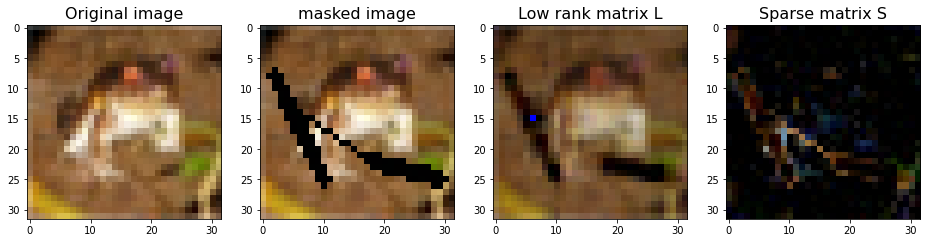

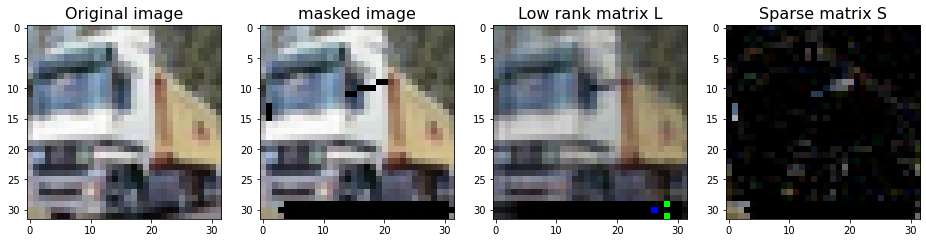

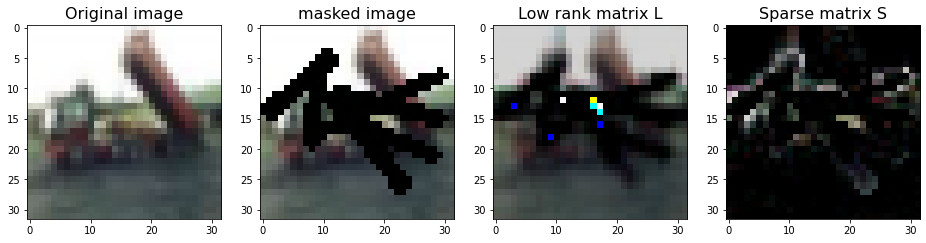

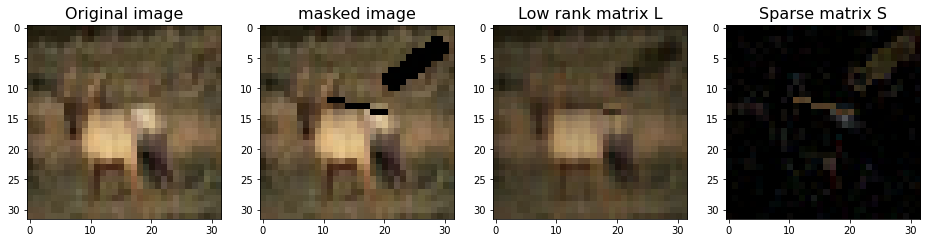

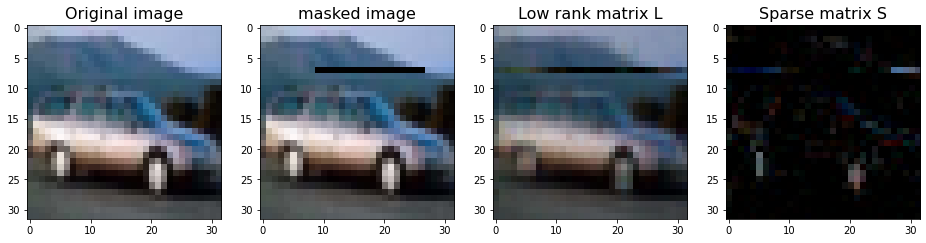

...

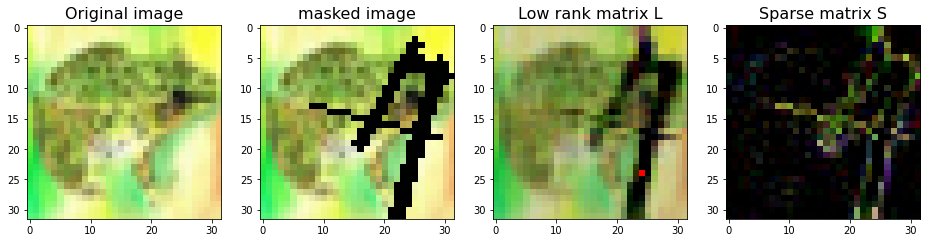

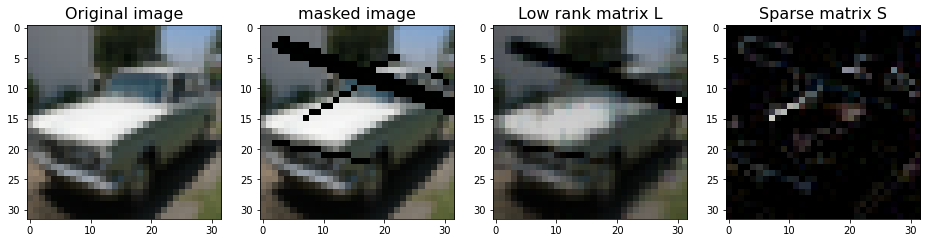

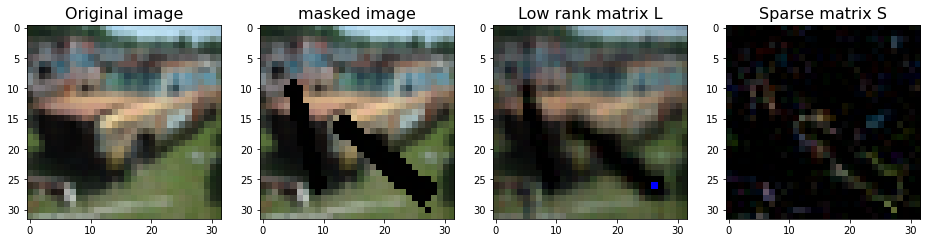

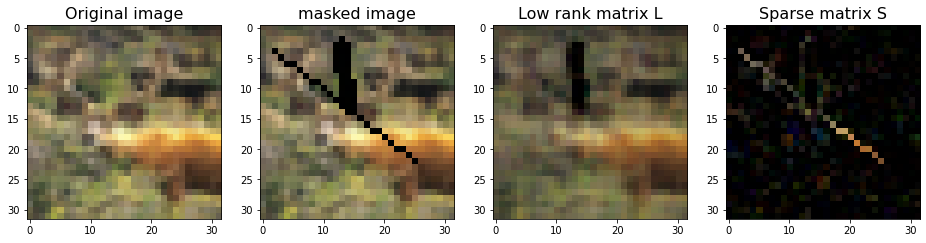

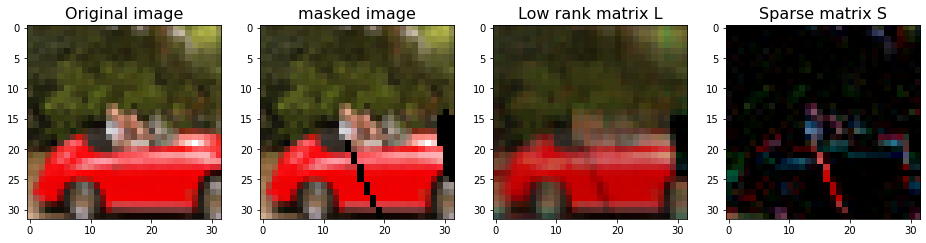

In [107]:
from zipfile import ZipFile as zip

from tensorflow import keras
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

sample_images = x_train[:100]
sample_labels = y_train[:100]


import tensorflow as tf
def dice_coef(y_true, y_pred):
   y_true_f = keras.backend.flatten(y_true)
   y_pred_f = keras.backend.flatten(y_pred)
   intersection = keras.backend.sum(y_true_f * y_pred_f)
   return (2. * intersection) / (keras.backend.sum(y_true_f + y_pred_f))

def get_psnr(y_true, y_pred):
  val = tf.image.psnr(y_true, y_pred, 255)
  return val
  

def get_ssim(y_true, y_pred):
  y_true_tensor = tf.image.convert_image_dtype(y_true, tf.float64)
  y_pred_tensor = tf.image.convert_image_dtype(y_pred, tf.float64)
  val = tf.image.ssim(y_true_tensor, y_pred_tensor, 255)
  return float(val)


def createMask( img):
    ## Prepare masking matrix
    
    mask = np.full(img.shape, 255, np.uint8)
    for _ in range(np.random.randint(1, 10)):
      # Get random x locations to start line
      x1, x2 = np.random.randint(1, img.shape[0]), np.random.randint(1, img.shape[1])
      # Get random y locations to start line
      y1, y2 = np.random.randint(1, img.shape[0]), np.random.randint(1, img.shape[1])
      # Get random thickness of the line drawn
      thickness = np.random.randint(1, 3)
      # Draw black line on the white mask
      cv2.line(mask,(x1,y1),(x2,y2),(1,1,1),thickness)

    # Perforn bitwise and operation to mak the image
    masked_image = cv2.bitwise_and(img, mask)

    return masked_image, mask

#masked_image, mask = createMask(img)
def image_LS(image ,maskes_image, L_image, S_image):
    
    fig, ax = plt.subplots(1,4,figsize=(16,6))
    ax[0].imshow(image.astype('uint8'))
    ax[0].set_title("Original image", fontsize = 16)
    ax[1].imshow(masked_image.astype('uint8'))
    ax[1].set_title("masked image", fontsize = 16)
    ax[2].imshow(L_image.astype('uint8'))
    ax[2].set_title("Low rank matrix L", fontsize = 16)
    ax[3].imshow(np.abs(S_image).astype('uint8'))
    ax[3].set_title("Sparse matrix S", fontsize = 16);
    


def s_tau(X, tau):
        """Shrinkage operator
            Sτ [x] = sign(x) max(|x| − τ, 0)
        """
        return np.sign(X)*np.maximum(np.abs(X)-tau,0)
    
def d_tau(X, mu):
        """Singular value thresholding operator
            Dτ (X) = USτ(Σ)V∗, where X = UΣV∗
        """
        # singular value decomposition
        u, s, vh = np.linalg.svd(X, full_matrices=False)

        # Shrinkage of singular values
        tau = 1.0/mu
        s = s[s>tau] - tau
        rank = len(s)
        # reconstruct thresholded 2D array
        return  np.dot(u[:, 0:rank] * s, vh[0:rank,:]), rank


def RobustPCA(M, tol, max_iter):
    
        size = M.shape
        
        # initialize S and Y (Lagrange multiplier)
        S = np.zeros(size)
        Y = np.zeros(size)

        # if lamb and mu are not set, set with default values
        mu = np.prod(size)/4.0/np.sum(np.abs(M))
        lamb = 1/np.sqrt(np.max(size))

        # Alternating update
        for i in range(max_iter):
            L, rank = d_tau(M-S+1.0/mu*Y, mu)
            S = s_tau(M-L+1.0/mu*Y, lamb/mu)

            # Calculate residuals
            residuals = M-1.2*L-S
            residuals_sum = np.linalg.norm(residuals,'fro')

            # Check convergency
            if residuals_sum <= 0.00001 * np.linalg.norm(M,'fro'):
                break

            Y = Y + mu*residuals

        # Check if the fit is converged
        if residuals_sum > 0.00001* np.linalg.norm(M,'fro'):
            print('Not converged!')
            print('Total error: %f, allowed tolerance: %f'%(residuals_sum, tol))
        else:
            print('Converged!')

        return L, S, rank

def PCA(M, max_iter):
    
        size = M.shape
        
        # initialize S and Y (Lagrange multiplier)
        S = np.zeros(size)
        Y = np.zeros(size)

        # if lamb and mu are not set, set with default values
        mu = np.prod(size)/4.0/np.sum(np.abs(M))
        lamb = 1/np.sqrt(np.max(size))

        # Alternating update
        for i in range(max_iter):
            L, rank = d_tau(M-S+1.0/mu*Y, mu)
            S = s_tau(M-L+1.0/mu*Y, lamb/mu)

            # Calculate residuals
            residuals = M-L-S
            residuals_sum = np.sum(np.abs(residuals))

            Y = Y + mu*residuals
        return L, S, rank

def dice_coef(y_true, y_pred):
    y_true = (y_true).astype('float64')
    y_pred = (y_pred).astype('float64')
    y_true_f = keras.backend.flatten(y_true)
    y_pred_f = keras.backend.flatten(y_pred)
    intersection = keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection) / (keras.backend.sum(y_true_f + y_pred_f))

def get_psnr(y_true, y_pred):
  val = tf.image.psnr(y_true, y_pred, 255)
  return val
  

def get_ssim(y_true, y_pred):
  y_true_tensor = tf.image.convert_image_dtype(y_true, tf.float32)
  y_pred_tensor = tf.image.convert_image_dtype(y_pred, tf.float32)
  val = tf.image.ssim(y_true_tensor, y_pred_tensor, 255)
  return float(val)

p1 = np.zeros(100)
s1 = np.zeros(100)
d1 = np.zeros(100)

for j in range (100):
    img = sample_images[j]
    masked_image, mask = createMask(img)
    image = masked_image/255
    print("Robust PCA ...");
    print ("for image",j+1)
    

    L_image = image*0
    S_image = image*0
    rank = [];

    for i in range(3):
        L_image[:,:,i] ,S_image[:,:,i], rnk = RobustPCA(image[:,:,i], tol = 0.5, max_iter=100000)
        rank.append(rnk)

    outputRPCA = (L_image*255).astype('uint8')
    p1[j] = get_psnr(img,L_image)
    s1[j] = get_ssim(img,L_image)
    d1[j] = dice_coef(img,L_image)

    #outputRPCA = (L_image*255).astype('uint8')
    #image_LS(image*255, L_image*255, S_image*255, thres=0)
    #image_LS(image*255, outputRPCA, S_image*255, thres=0)
    image_LS(img, image*255, outputRPCA, S_image*255)













In [ ]:
from zipfile import ZipFile
  
# specifying the zip file name
file_name_new = "test.zip"
# opening the zip file in READ mode
with ZipFile(file_name_new, 'r') as zip:
    # printing all the contents of the zip file
    zip.printdir()
  
    # extracting all the files
    print('Extracting all the files now...')
    zip.extractall()
    print('Done!')

In [115]:
test_path_new = './fii/test/'
test_folders_new = os.listdir(test_path)
test_files_new = []

for folder in test_folders_new:
    files_f_new = os.listdir(test_path_new + folder + '/')
    for file in files_f_new:
        test_files_new.append(test_path_new + folder + '/' + file)

In [117]:
#@title Default title text
import tensorflow as tf
def dice_coef(y_true, y_pred):
   y_true_f = keras.backend.flatten(y_true)
   y_pred_f = keras.backend.flatten(y_pred)
   intersection = keras.backend.sum(y_true_f * y_pred_f)
   return (2. * intersection) / (keras.backend.sum(y_true_f + y_pred_f))

def get_psnr(y_true, y_pred):
  val = tf.image.psnr(y_true, y_pred, 255)
  return val
  

def get_ssim(y_true, y_pred):
  y_true_tensor = tf.image.convert_image_dtype(y_true, tf.float64)
  y_pred_tensor = tf.image.convert_image_dtype(y_pred, tf.float64)
  val = tf.image.ssim(y_true_tensor, y_pred_tensor, 255)
  return float(val)


def createMask( img):
    ## Prepare masking matrix
    
    mask = np.full(img.shape, 255, np.uint8)
    for _ in range(np.random.randint(1, 10)):
      # Get random x locations to start line
      x1, x2 = np.random.randint(1, img.shape[0]), np.random.randint(1, img.shape[1])
      # Get random y locations to start line
      y1, y2 = np.random.randint(1, img.shape[0]), np.random.randint(1, img.shape[1])
      # Get random thickness of the line drawn
      thickness = np.random.randint(1, 3)
      # Draw black line on the white mask
      cv2.line(mask,(x1,y1),(x2,y2),(1,1,1),thickness)

    # Perforn bitwise and operation to mak the image
    masked_image = cv2.bitwise_and(img, mask)

    return masked_image, mask

#masked_image, mask = createMask(img)
def image_LS(image ,maskes_image, L_image, S_image):
    
    fig, ax = plt.subplots(1,4,figsize=(16,6))
    ax[0].imshow(image.astype('uint8'))
    ax[0].set_title("Original image", fontsize = 16)
    ax[1].imshow(masked_image.astype('uint8'))
    ax[1].set_title("masked image", fontsize = 16)
    ax[2].imshow(L_image.astype('uint8'))
    ax[2].set_title("Low rank matrix L", fontsize = 16)
    ax[3].imshow(np.abs(S_image).astype('uint8'))
    ax[3].set_title("Sparse matrix S", fontsize = 16);
    


def s_tau(X, tau):
        """Shrinkage operator
            Sτ [x] = sign(x) max(|x| − τ, 0)
        """
        return np.sign(X)*np.maximum(np.abs(X)-tau,0)
    
def d_tau(X, mu):
        """Singular value thresholding operator
            Dτ (X) = USτ(Σ)V∗, where X = UΣV∗
        """
        # singular value decomposition
        u, s, vh = np.linalg.svd(X, full_matrices=False)

        # Shrinkage of singular values
        tau = 1.0/mu
        s = s[s>tau] - tau
        rank = len(s)
        # reconstruct thresholded 2D array
        return  np.dot(u[:, 0:rank] * s, vh[0:rank,:]), rank


def RobustPCA(M, tol, max_iter):
    
        size = M.shape
        
        # initialize S and Y (Lagrange multiplier)
        S = np.zeros(size)
        Y = np.zeros(size)

        # if lamb and mu are not set, set with default values
        mu = np.prod(size)/4.0/np.sum(np.abs(M))
        lamb = 1/np.sqrt(np.max(size))

        # Alternating update
        for i in range(max_iter):
            L, rank = d_tau(M-S+1.0/mu*Y, mu)
            S = s_tau(M-L+1.0/mu*Y, lamb/mu)

            # Calculate residuals
            residuals = M-1.2*L-S
            residuals_sum = np.linalg.norm(residuals,'fro')

            # Check convergency
            if residuals_sum <= 0.001 * np.linalg.norm(M,'fro'):
                break

            Y = Y + mu*residuals

        # Check if the fit is converged
        if residuals_sum > 0.001* np.linalg.norm(M,'fro'):
            print('Not converged!')
            print('Total error: %f, allowed tolerance: %f'%(residuals_sum, tol))
        else:
            print('Converged!')

        return L, S, rank

def PCA(M, max_iter):
    
        size = M.shape
        
        # initialize S and Y (Lagrange multiplier)
        S = np.zeros(size)
        Y = np.zeros(size)

        # if lamb and mu are not set, set with default values
        mu = np.prod(size)/4.0/np.sum(np.abs(M))
        lamb = 1/np.sqrt(np.max(size))

        # Alternating update
        for i in range(max_iter):
            L, rank = d_tau(M-S+1.0/mu*Y, mu)
            S = s_tau(M-L+1.0/mu*Y, lamb/mu)

            # Calculate residuals
            residuals = M-L-S
            residuals_sum = np.sum(np.abs(residuals))

            Y = Y + mu*residuals
        return L, S, rank

def dice_coef(y_true, y_pred):
    y_true = (y_true).astype('float64')
    y_pred = (y_pred).astype('float64')
    y_true_f = keras.backend.flatten(y_true)
    y_pred_f = keras.backend.flatten(y_pred)
    intersection = keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection) / (keras.backend.sum(y_true_f + y_pred_f))

def get_psnr(y_true, y_pred):
  val = tf.image.psnr(y_true, y_pred, 255)
  return val
  

def get_ssim(y_true, y_pred):
  y_true_tensor = tf.image.convert_image_dtype(y_true, tf.float32)
  y_pred_tensor = tf.image.convert_image_dtype(y_pred, tf.float32)
  val = tf.image.ssim(y_true_tensor, y_pred_tensor, 255)
  return float(val)

p2 = np.zeros(7300)
s2 = np.zeros(7300)
d2 = np.zeros(7300)

for j in range (7300):
    img = imread(test_files[j])
    masked_image, mask = createMask(img)
    image = masked_image/255
    print("Robust PCA ...");
    print ("for image",j+1)
    

    L_image = image*0
    S_image = image*0
    rank = [];

    for i in range(3):
        L_image[:,:,i] ,S_image[:,:,i], rnk = RobustPCA(image[:,:,i], tol = 0.5, max_iter=100000)
        rank.append(rnk)

    outputRPCA = (L_image*255).astype('uint8')
    p2[j] = get_psnr(img,L_image)
    s2[j] = get_ssim(img,L_image)
    d2[j] = dice_coef(img,L_image)

    #outputRPCA = (L_image*255).astype('uint8')
    #image_LS(image*255, L_image*255, S_image*255, thres=0)
    #image_LS(image*255, outputRPCA, S_image*255, thres=0)
    #this image_LS(img, image*255, outputRPCA, S_image*255)







Streaming output truncated to the last 5000 lines.
Robust PCA ...
for image 6301
Converged!
Converged!
Converged!
Robust PCA ...
for image 6302
Converged!
Converged!
Converged!
Robust PCA ...
for image 6303
Converged!
Converged!
Converged!
Robust PCA ...
for image 6304
Converged!
Converged!
Converged!
Robust PCA ...
for image 6305
Converged!
Converged!
Converged!
Robust PCA ...
for image 6306
Converged!
Converged!
Converged!
Robust PCA ...
for image 6307
Converged!
Converged!
Converged!
Robust PCA ...
for image 6308
Converged!
Converged!
Converged!
Robust PCA ...
for image 6309
Converged!
Converged!
Converged!
Robust PCA ...
for image 6310
Converged!
Converged!
Converged!
Robust PCA ...
for image 6311
Converged!
Converged!
Converged!
Robust PCA ...
for image 6312
Converged!
Converged!
Converged!
Robust PCA ...
for image 6313
Converged!
Converged!
Converged!
Robust PCA ...
for image 6314
Converged!
Converged!
Converged!
Robust PCA ...
for image 6315
Converged!
Converged!
Converged!
Robu